# **Setting up Necessary things**

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 32 # batch size
version = 2

In [2]:
!pip install -Uqq fastai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 71.2 MB/s eta 0:00:00


In [3]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd /content/drive/My Drive/MasterCourse/Supercar Recognizer

/content/drive/My Drive/MasterCourse/Supercar Recognizer


# **Fetch Data**

In [6]:
data_path = "data"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,                        # get_image_files returns a list of all images in that path recursively by default
    splitter=RandomSplitter(valid_pct=0.1, seed=42),  # getting 90-10 train-validation split
    get_y=parent_label,                               # taking the folder name as labels
    item_tfms=Resize(128))                            # resizing to get the image of same shape

In [7]:
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)
torch.save(dls, f"dataloaders/car_dataloader_v{version}.pkl")

In [ ]:
# dls = torch.load(f"dataloaders/cap_dataloader_v{version}.pkl")

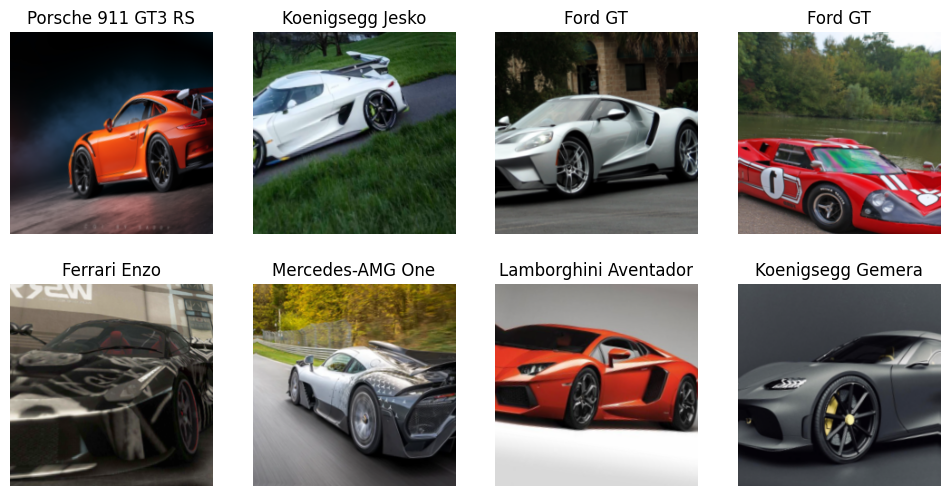

In [8]:
dls.train.show_batch(max_n=8, nrows=2)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


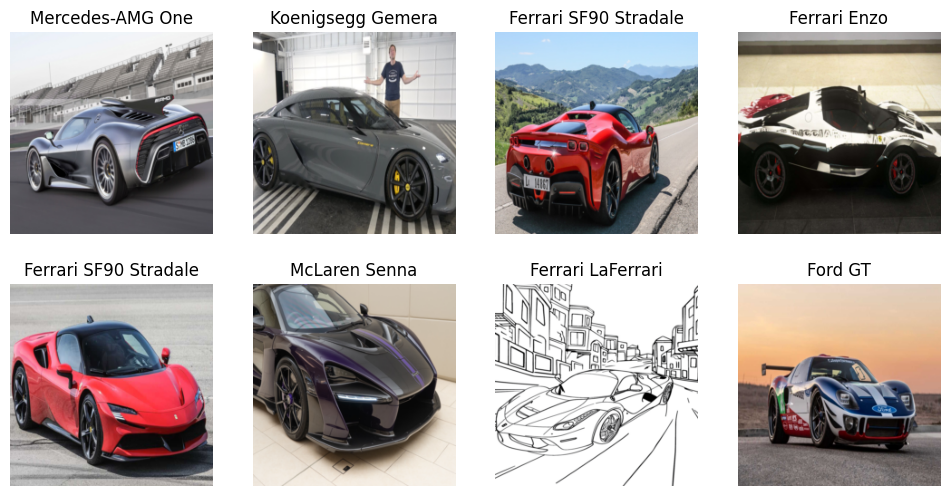

In [9]:
dls.valid.show_batch(max_n=8, nrows=2)

In [10]:
dls.train.vocab


['Aston Martin Valkyrie', 'Bugatti Chiron', 'Ferrari Daytona SP3', 'Ferrari Enzo', 'Ferrari LaFerrari', 'Ferrari SF90 Stradale', 'Ford GT', 'Hennessey Venom F5 Roadster', 'Koenigsegg Gemera', 'Koenigsegg Jesko', 'Lamborghini Aventador', 'Lamborghini Revuelto', 'McLaren P1', 'McLaren Senna', 'Mercedes-AMG One', 'Pagani Zonda', 'Porsche 911 GT3 RS', 'Porsche 918 Spyder', 'Rimac Nevera', 'Zenvo Aurora']

# **Training and Data cleaning**

In [ ]:
model_path = "models"

In [ ]:
model = vision_learner(dls, resnet50, metrics=[error_rate,accuracy])

In [ ]:
model.load(f"car-recognizer-v{version-1}")

In [ ]:
#model.fine_tune(10)

In [ ]:
model.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.580718,1.370825,0.369369,0.630631,15:11


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.231669,0.814238,0.207207,0.792793,02:36
1,0.841942,0.552934,0.159159,0.840841,02:34
2,0.545120,0.428337,0.117117,0.882883,02:34
3,0.341744,0.357666,0.090090,0.909910,02:34
4,0.250795,0.351730,0.081081,0.918919,02:35


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.351973,0.147068,0.045181,0.954819,02:30


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.300382,0.150713,0.036145,0.963855,02:33
1,0.255672,0.116684,0.033133,0.966867,02:28
2,0.148395,0.105986,0.033133,0.966867,02:31


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
model.fine_tune(2)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.156845,0.076718,0.027190,0.972810,02:27


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.138566,0.080367,0.033233,0.966767,02:33
1,0.127803,0.061312,0.015106,0.984894,02:32


In [ ]:
model.save(f"car-recognizer-v{version}")

Path('models/car-recognizer-v2.pth')

In [ ]:
# model.load(f"cap-recognizer-v{version}")

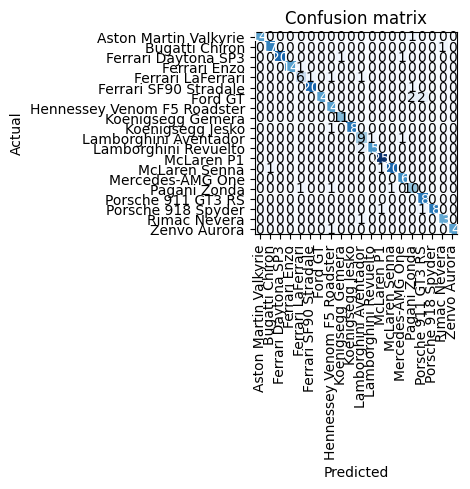

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

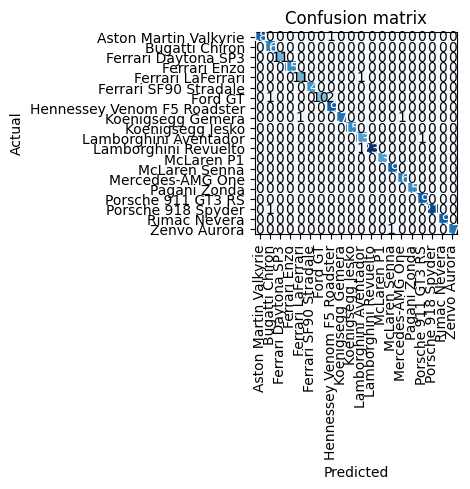

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

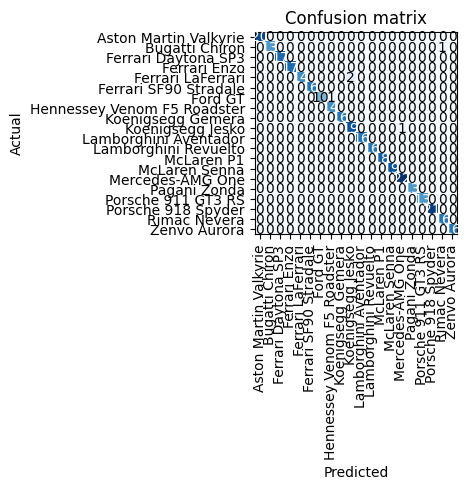

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

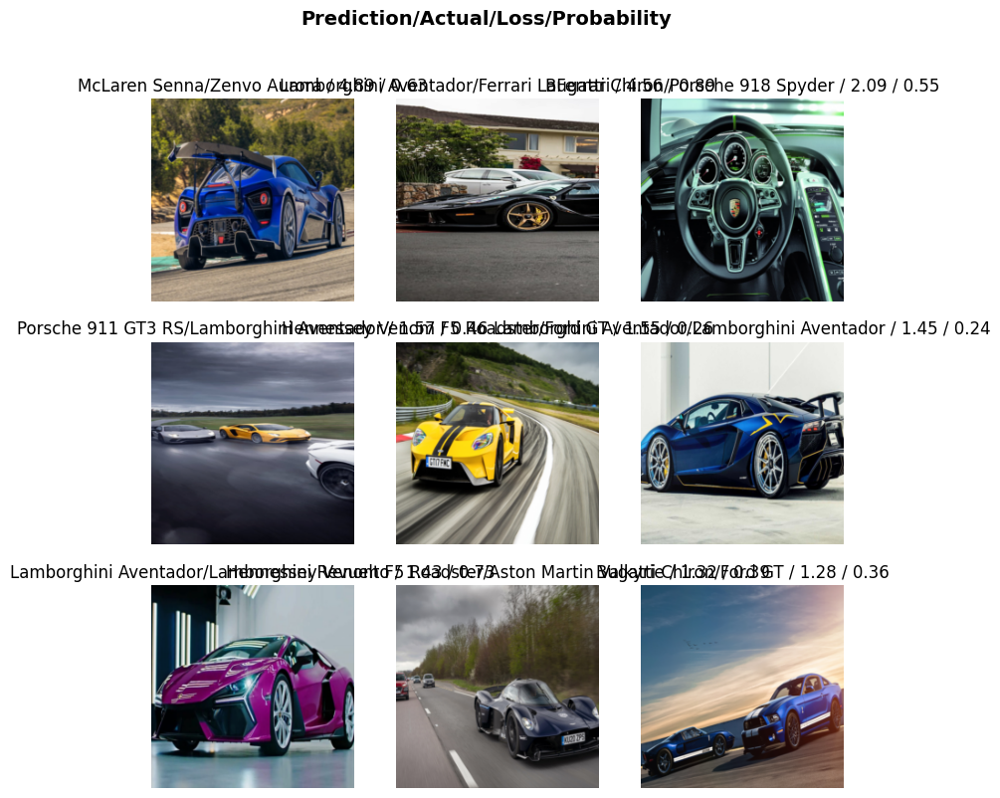

In [ ]:
interp.plot_top_losses(9, nrows=3)

In [ ]:
cleaner = ImageClassifierCleaner(model)
cleaner 

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
cleaner.delete()

(#1) [3]

In [ ]:
cleaner.change()

(#3) [(0, 'Lamborghini Revuelto'),(1, 'Lamborghini Revuelto'),(20, 'Lamborghini Revuelto')]

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") # change the directory

In [ ]:
model.export(f"{model_path}/cap-recognizer-v{version}.pkl")